# ***Part-1 -> Perceptron ***

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('placement.csv')
df.head()

,cgpa,resume_score,placed
0,8.14,6.52,1
1,6.17,5.17,0
2,8.27,8.86,1
3,6.88,7.27,1
4,7.52,7.30,1


In [ ]:
df.shape

(100, 3)

<Axes: xlabel='cgpa', ylabel='resume_score'>

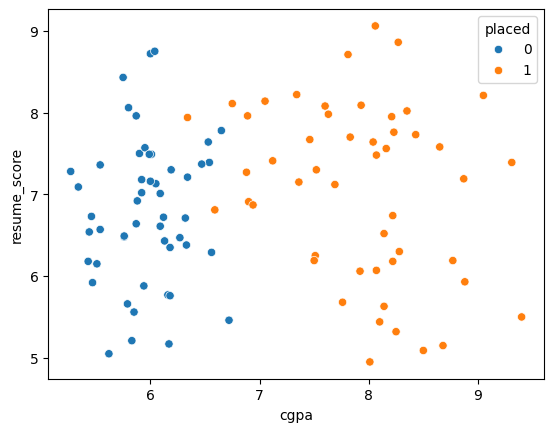

In [ ]:
sns.scatterplot(x=df['cgpa'],y=df['resume_score'],hue=df['placed'])

In [ ]:
X = df.iloc[:,0:2]
y = df.iloc[:,-1]

In [ ]:
#Import Perceptron and apply fit on that
from sklearn.linear_model import Perceptron
p = Perceptron()
p.fit(X,y)

Perceptron()

In [ ]:
#returns the weights learned
p.coef_

array([[ 40.26, -36.  ]])

In [ ]:
#returns the bias term (also called intercept)
p.intercept_

array([-25.])

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but Perceptron was fitted with feature names
  warnings.warn(


<Axes: >

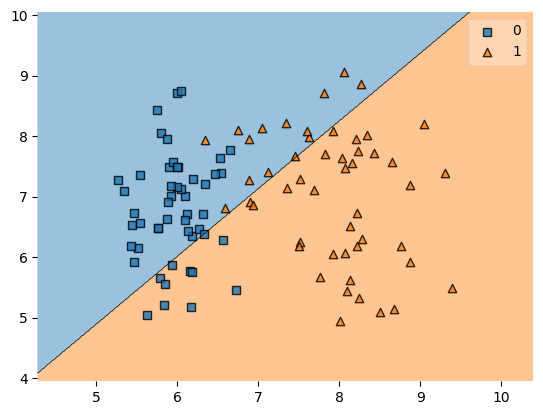

In [ ]:
#Plot the Line
from mlxtend.plotting import plot_decision_regions
plot_decision_regions(X.values,y.values,p)

# ***Part-2 -> Perceptron Trick : How to Train a Perceptron ***

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification

In [ ]:
#n_informative=1, 2 features: 1 feature useful feature & 1 is just noise
#n_redundant=0 No redundant (linearly dependent) features
#n_classes=2, Class 0 cluster ●●●●●●●, Class 1 cluster ○○○○○○○
#random_state=41, Fixes randomness - same dataset every time you run.
#hypercube=False, True-cube-like cluster, False-Gaussian cluster
#class_sep=10, controls how far two classes separated,(10)-classes FAR apart-perceptron finds clear boundary

X, y = make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0,
       n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=10)

In [ ]:
X.shape, y.shape

((100, 2), (100,))

In [ ]:
X, y

(array([[ 0.19924745, -0.11697552],
        [-0.24882029, -0.73115232],
        [-0.3544904 , -0.7081059 ],
        [-1.59086506, -2.01199214],
        [-0.20083951,  1.63493163],
        [-0.83241122,  0.15599044],
        [-1.79207014,  1.07782053],
        [ 0.0856607 ,  0.80626713],
        [-0.55865299,  0.74859527],
        [-1.95974262,  0.75152794],
        [-1.77828947, -0.90114581],
        [-1.77985853, -0.1815243 ],
        [-0.02194151, -2.98092432],
        [ 0.80563431,  1.20500136],
        [-1.82701214,  0.78302407],
        [ 0.38730728,  0.42968688],
        [-0.14108668, -0.73229726],
        [-1.87955941, -0.83930476],
        [-0.18232911,  0.83727062],
        [-1.77059533, -0.10255323],
        [-2.27658028,  0.65867001],
        [-2.06519502,  0.92649819],
        [-1.31690551,  0.10216193],
        [ 1.61043259,  0.46886454],
        [-1.21650394,  0.45432938],
        [ 0.6139723 ,  1.8613386 ],
        [-1.78760957, -0.79255991],
        [-1.04149161, -1.000

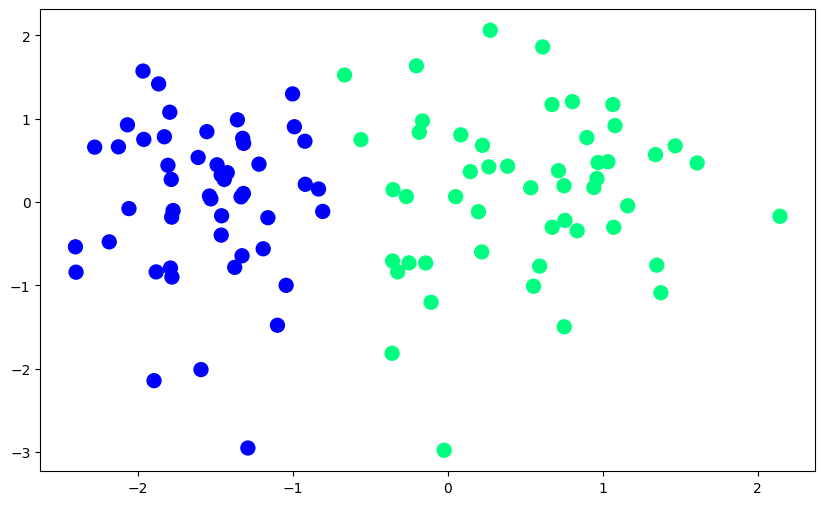

In [ ]:
#plot width 10 inches and height 6 inches, X[:,0] all X1 values, X[:,1] all X2 values
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100) #Point size 100 big dots

In [ ]:
#Activation function of Perceptron, input +ve → predict 1, input zero or negative → predict 0
def step(z):
  return 1 if z>0 else 0

In [ ]:
#Apply Binary classifier using Perceptron Learning Rule: w=w+η(y−y^​)x
def perceptron(X,y):
  X = np.insert(X, 0, 1, axis=1) #Add Bias -> from [x1, x2] to this [1, x1, x2]
  weights = np.ones(X.shape[1]) # X.shape[1] has 3 column which are : (bias=1, w1=1, w2=1),
  lr = 0.1 #learning rate

  for i in range(1000):
    j = np.random.randint(X.shape[0]) #Pick a random index
    y_hat = step(np.dot(X[j], weights)) #Predict using step func, y_hat= step(1*w0 + x1*w1 + x2*w2)
    weights = weights + lr*(y[j] - y_hat)*X[j] #Apply Weight Update formla

  return weights[0],weights[1:]    #bias → weights[0], coefficients→[weights[1], weights[2]]

In [ ]:
intercept_, coef_ = perceptron(X,y)
print('coeficient : ', coef_)
print('Intercept : ',intercept_)

coeficient :  [1.33302891 0.1696841 ]
Intercept :  1.0


In [ ]:
#w0*1 + w1*x + w2*y = 0, y = -(w1/w2)x - (w0/w2), y=mx+c line equation
m = -(coef_[0]/coef_[1]) #slope
b = -(intercept_/coef_[1]) #intercept
print('Slope : ', m)
print('Intercept : ', b)

Slope :  -7.855944563650305
Intercept :  -5.893303951782135


In [ ]:
#Generates 100 x-values and computes corresponding y-values.
x_input = np.linspace(-3,3,100)
y_input = m * x_input + b

(-3.0, 2.0)

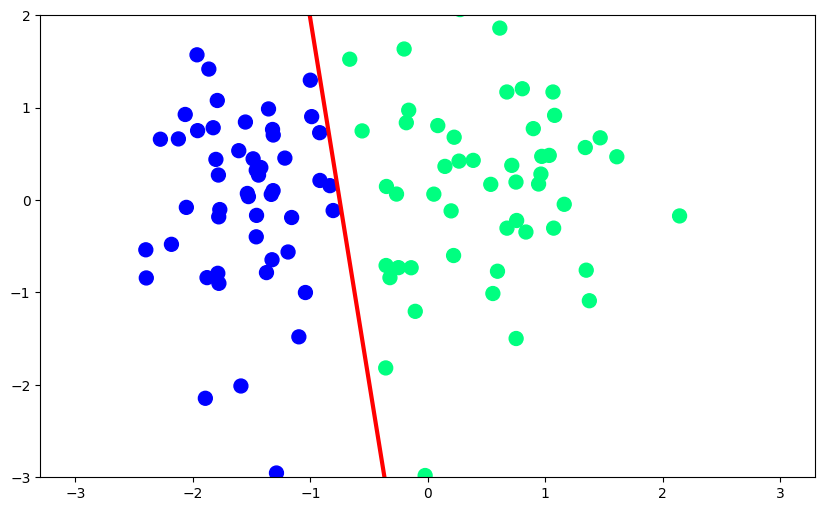

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(x_input, y_input, color='red', linewidth=3)
plt.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)
plt.ylim(-3,2) #ylim ended and then y_input starts on same line

In [ ]:
#we are storing store m & b for animation
def perceptron(X,y):
  m = []  # list that will store slope of decision boundary after each update
  b = []  # list that will store intercept afte#Learning rater each update

  X = np.insert(X,0,1,axis=1) #Inserts a constant 1 at column index 0, If X = [x1, x2], becomes [1, x1, x2], Here 1 represents bias
  weights = np.ones(X.shape[1]) #Creates weight vector full of 1s, For 3 inputs [1, x1, x2], we get weights [1, 1, 1]
  lr = 0.1  #Learning rate
  for i in range(200):  #Repeat weight update 200 times
    j=np.random.randint(0,100)  #Select a random index from 0 and 99
    y_hat = step(np.dot(X[j],weights)) #Get this (w0*1 + w1*x1 + w2*x2) & Then Passes it into a step activation function (0 or 1)
    weights = weights + lr*(y[j] - y_hat)*X[j] #If prediction correct: no update, If wrong: new_weights=old_weights+lr*error*input

    m.append(-weights[1]/weights[2]) #Store Slope
    b.append(-weights[0]/weights[2]) #Store Intercept

  return m,b

In [ ]:
# m:list of slopes for any no. of epochs, b:list of intercepts
m,b = perceptron(X,y)

In [ ]:
#Both cannot run together normally, but animation works because the notebook backend overrides inline.
%matplotlib inline #renders static images
from IPython.display import HTML
%matplotlib notebook #enables interactive animations
from matplotlib.animation import FuncAnimation

In [ ]:
fig, ax = plt.subplots(figsize=(8,4))
x_i = np.arange(-3, 3, 0.1) # Values from -3 to 3 used to draw boundary with each time 0.1 increament
y_i = x_i*m[0] + b[0] #Decision boundary after first weight update

ax.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100) #Points colored according to class labels
line, = ax.plot(x_i, y_i, 'r-', linewidth=2) #Plot initial decision line

plt.ylim(-3,3) #Set axis limits

#Update function for animation
def update(i):
    label = 'epoch {0}'.format(i+1)  #Creates a text label showing the current epoch on x-axis
    line.set_ydata(x_i*m[i] + b[i]) #Updates the line equation to the current slope & intercept
    ax.set_xlabel(label) #changes the y-values of the red line
    # return line, anex

ani = FuncAnimation(fig, update, frames=200, interval=100) #frames=200 : One for each slope/intercept update, interval=100 ms b/w frames

HTML(ani.to_jshtml()) #Converts animation → HTML JavaScript, Makes it display inside notebook


<IPython.core.display.Javascript object>

# ***Part-3 -> Perceptron Loss Function ***

In [ ]:
import numpy as np
from sklearn.datasets import make_classification

In [ ]:
X, y = make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0,
       n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=15) #class_sep saparates the points by distance

In [ ]:
X,y

(array([[ 0.35523945, -0.11697552],
        [-0.09282829, -0.73115232],
        [-0.1984984 , -0.7081059 ],
        [-2.44001098, -2.01199214],
        [-0.0448475 ,  1.63493163],
        [-1.68155714,  0.15599044],
        [-2.64121606,  1.07782053],
        [ 0.2416527 ,  0.80626713],
        [-0.40266099,  0.74859527],
        [-2.80888854,  0.75152794],
        [-2.62743539, -0.90114581],
        [-2.62900445, -0.1815243 ],
        [ 0.13405049, -2.98092432],
        [ 0.96162631,  1.20500136],
        [-2.67615806,  0.78302407],
        [ 0.54329928,  0.42968688],
        [ 0.01490532, -0.73229726],
        [-2.72870533, -0.83930476],
        [-0.02633711,  0.83727062],
        [-2.61974125, -0.10255323],
        [-3.1257262 ,  0.65867001],
        [-2.91434094,  0.92649819],
        [-2.16605143,  0.10216193],
        [ 1.76642459,  0.46886454],
        [-2.06564986,  0.45432938],
        [ 0.7699643 ,  1.8613386 ],
        [-2.63675549, -0.79255991],
        [-1.89063753, -1.000

In [ ]:
X.shape, y.shape

((100, 2), (100,))

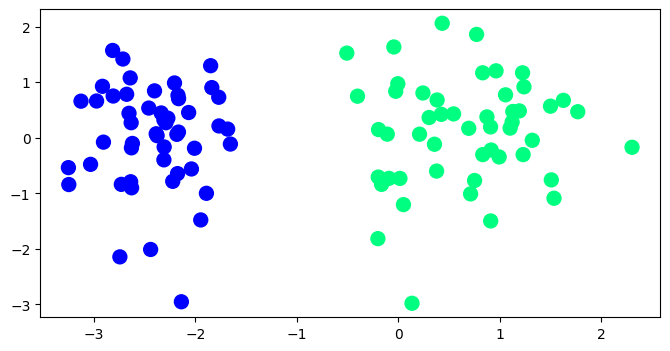

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(8,4))
plt.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)

In [ ]:
def perceptron(X,y):

  w1=w2=b=1
  lr=0.1

  for j in range(1000):
    for i in range(X.shape[0]):
      #check condition
      z = w1*X[i][0] + w2*X[i][1] + b*1

      if z*y[i] < 0:
        w1 = w1 + lr*y[i]*X[i][0]
        w2 = w2 + lr*y[i]*X[i][1]
        b = b + lr*y[i]
  return w1,w2,b

In [ ]:
w1,w2,b = perceptron(X,y)
print('w1 : ', w1)
print('w2 : ', w2)
print('b : ',intercept_)

w1 :  1.006638570722407
w2 :  0.22215119727529098
b :  1.0


In [ ]:
m = -(w1/w2) #slope
b = -(b/w2) #intercept
print('Slope : ', m)
print('Intercept : ', b)

Slope :  -4.531321834268464
Intercept :  -5.851870329508209


(-3.0, 2.0)

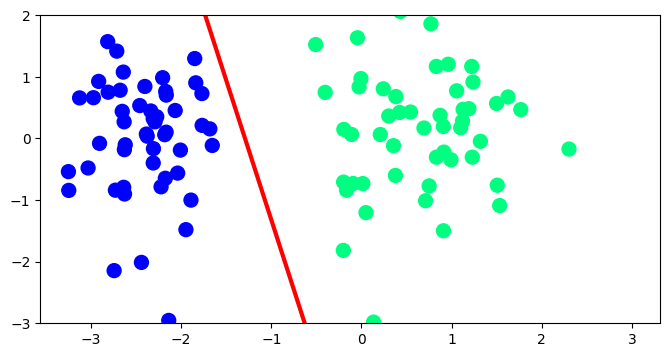

In [ ]:
x_input = np.linspace(-3,3,100)
y_input = m * x_input + b
plt.figure(figsize=(8,4))
plt.plot(x_input, y_input, color='red', linewidth=3)
plt.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)
plt.ylim(-3,2)